## Uso de Embeddings
### Lectura y procesamiento de datos sobre libros

In [1]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

In [2]:
import os

os.environ["OMP_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"

In [3]:
from sentence_transformers import SentenceTransformer
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

**Carga de datos desde csv**

In [4]:
data = pd.read_csv('lectulandia_books.csv')

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62279 entries, 0 to 62278
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   url         62279 non-null  object
 1   titulo      62279 non-null  object
 2   autor       62278 non-null  object
 3   autor_url   62278 non-null  object
 4   sinapsis    47830 non-null  object
 5   imagen_url  62279 non-null  object
 6   generos     62278 non-null  object
dtypes: object(7)
memory usage: 3.3+ MB


Por lo pronto, se opta por trabajar solo con dos variables: **sinopsis y géneros**.

In [6]:
selec_data = data[['sinapsis', 'generos']]
selec_data.head()

,sinapsis,generos
0,La oscuridad de un alma herida es el hogar de ...,Intriga - Novela
1,"El mal medra, y la magia se ha pervertido. En ...",Fantástico - Novela
2,"Durante el funeral de su abuelo, Simon descubr...",Histórico - Novela
3,ATRÉVETE A VIVIR EN EL FASCINANTE MUNDO DE JAM...,Juegos - Manuales y cursos - Referencia
4,"Tras varios años alejado del que fue su hogar,...",Histórico - Novela - Romántico


Se procede a preprocesamientos rápidos relacionados a caracteres especiales y uso de mayúsculas.

In [7]:
selec_data['sinapsis'] = selec_data['sinapsis'].str.lower()

In [8]:
selec_data['generos'] = selec_data['generos'].astype(str)

In [9]:
selec_data['generos'] = selec_data['generos'].str.strip()

In [10]:
# Se busca lo que NO sea letra, espacio o guion
patron = r'[^a-zA-ZáéíóúÁÉÍÓÚñÑ\-\s]'

fuera_de_norma = selec_data[selec_data['generos'].str.contains(patron, na=False)]

print(f"Se encontraron {len(fuera_de_norma)} registros con caracteres especiales.")
fuera_de_norma['generos'].head()

Se encontraron 1531 registros con caracteres especiales.


53                     Intriga - Novela - Polic√≠aco
86                 Ciencias naturales - Divulgaci√≥n
91                              Fantﾃ｡stico - Novela
179                              Cr√≥nica - Memorias
228    Divulgaci√≥n - Salud y Bienestar - Sexualidad
Name: generos, dtype: object

In [11]:
selec_data['generos'] = selec_data['generos'].str.replace('√≠', 'í')
selec_data['generos'] = selec_data['generos'].str.replace('ﾃｭ', 'í')
selec_data['generos'] = selec_data['generos'].str.replace('√≥', 'ó')
selec_data['generos'] = selec_data['generos'].str.replace('ﾃｳ', 'ó')
selec_data['generos'] = selec_data['generos'].str.replace('ﾃ｡', 'á')
selec_data['generos'] = selec_data['generos'].str.replace('√°', 'á')
selec_data['generos'] = selec_data['generos'].str.replace('√∫', 'ú')
selec_data['generos'] = selec_data['generos'].str.replace('√©', 'é')

Modificación de datos nulos:

In [12]:
selec_data['sinapsis'] = selec_data['sinapsis'].fillna("")
selec_data['generos'] = selec_data['generos'].fillna("")

Cantidad de géneros únicos (datos relevante para procesamientos futuros):

In [13]:
len(selec_data.generos.unique())

3297

**Generación de embeddings sobre la variable "sinopsis":**

In [14]:
model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')

In [15]:
pool = model.start_multi_process_pool()

try:
    sinopsis_vect = model.encode(
        selec_data['sinapsis'].astype(str).tolist(), 
        pool=pool, 
        batch_size=64,
        chunk_size=1000, 
        show_progress_bar=True)

finally:
    model.stop_multi_process_pool(pool)
print(f"Matriz final: {sinopsis_vect.shape}")

Chunks:   0%|          | 0/63 [00:00<?, ?it/s]

Matriz final: (62279, 384)


In [16]:
np.save('sinopsis_embeddings.npy', sinopsis_vect)

Examinación general sobre los embeddings:

In [17]:
sinopsis_vect = np.load('sinopsis_embeddings.npy')

In [18]:
print(f"Filas: {sinopsis_vect.shape[0]}, Columnas/Dimensiones: {sinopsis_vect.shape[1]}")

Filas: 62279, Columnas/Dimensiones: 384


Explicación: una fila por sinopsis; el modelo elegido comprime las características a 384 dimensiones.

**Reducción y visualización de dimensiones**

Con PCA:

In [19]:
from sklearn.decomposition import PCA

In [20]:
X = sinopsis_vect.copy()

In [21]:
pca = PCA(n_components=0.95)
pca_resultados = pca.fit_transform(X)

In [22]:
print(f"Varianza explicada por PCA: {pca.explained_variance_ratio_.sum():.2%}, dim. cubiertas: {pca.n_components_}")

Varianza explicada por PCA: 95.00%, dim. cubiertas: 183


Graficado de embeddings con PCA:

In [24]:
df_full = selec_data.copy()

df_full['pca_1'] = pca_resultados[:, 0]
df_full['pca_2'] = pca_resultados[:, 1]
df_full['pca_3'] = pca_resultados[:, 2]

In [25]:
fig = px.scatter_3d(
    df_full, 
    x='pca_1', 
    y='pca_2', 
    z='pca_3',
    color='generos',
    hover_name='generos',
    opacity=0.4,
    title=f"PCA Completo: 62,279 Películas (95% Varianza preservada)",
    template='plotly_dark')


fig.update_traces(marker=dict(
    size=1.5,
    line=dict(width=0)))

fig.update_layout(
    scene=dict(
        xaxis_title='PCA 1',
        yaxis_title='PCA 2',
        zaxis_title='PCA 3'
    ))
fig.show()

Con t-SNE:

In [29]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
os.environ["OMP_NUM_THREADS"] = "8"
os.environ["MKL_NUM_THREADS"] = "8"

In [27]:
from sklearn.manifold import TSNE

In [30]:
size_ej = 10000
idx = np.random.choice(len(selec_data), size_ej, replace=False)

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_resultados = tsne.fit_transform(sinopsis_vect[idx])

In [31]:
tsne_resultados = tsne.fit_transform(sinopsis_vect[idx])

In [32]:
tsne_resultados.shape

(10000, 2)

Graficado de embeddings con t-SNE:

In [33]:
data_plot = selec_data.iloc[idx].copy()
data_plot['x'] = tsne_resultados[:, 0]
data_plot['y'] = tsne_resultados[:,1]

In [35]:
fig = px.scatter(
    data_plot,
    x='x', y='y',
    hover_name='generos',
    hover_data=['sinapsis'],
    title='Embedding según t-SNE',
    template='plotly_dark',
    color='generos')
fig.update_traces(marker=dict(size=5))
fig.show()

Tanto en el gráfico de PCA como en el de t-SNE, se observa una gran masa central donde todos los colores están mezclados. Esto indica que las sinopsis de diferentes géneros comparten un espacio semántico muy similar.

**Modelo de clasificación de géneros**

In [64]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder

import tensorflow as tf
from tensorflow.keras import layers, models, Input

In [47]:
X = sinopsis_vect
le = LabelEncoder()
y = le.fit_transform(selec_data['generos'])

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Por cuestiones de velocidad, se elige un modelo de redes neuronales.

In [58]:
mod_clas = models.Sequential([
    Input(shape=(384,)),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.2),
    layers.Dense(len(le.classes_), activation='softmax')])

In [59]:
mod_clas.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy'])
mod_clas.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 256)            │        98,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 3297)           │       425,313 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 556,769 (2.12 MB)

 Trainable params: 556,769 (2.12 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = mod_clas.fit(
    X_train, y_train,
    epochs=30,
    batch_size=128,
    validation_split=0.2,
    verbose=1)

Epoch 1/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.0592 - loss: 5.4578 - val_accuracy: 0.0990 - val_loss: 4.9718
Epoch 2/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.1184 - loss: 4.8245 - val_accuracy: 0.1334 - val_loss: 4.7579
Epoch 3/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.1375 - loss: 4.6179 - val_accuracy: 0.1422 - val_loss: 4.6650
Epoch 4/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.1452 - loss: 4.5027 - val_accuracy: 0.1502 - val_loss: 4.6197
Epoch 5/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.1538 - loss: 4.4120 - val_accuracy: 0.1549 - val_loss: 4.5856
Epoch 6/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.1625 - loss: 4.3365 - val_accuracy: 0.1654 - val_loss: 4.5476
Epoch 7/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.1688 - loss: 4.2722 - val_accuracy: 0.1687 - val_loss: 4.5277
Epoch 8/30
312/312 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.1719 - loss: 4.2125 - val_accu

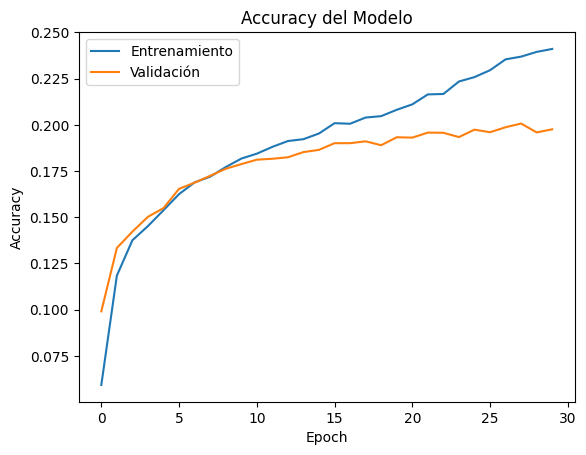

In [63]:
plt.plot(history.history['accuracy'], label='Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Validación')
plt.title('Accuracy del Modelo')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

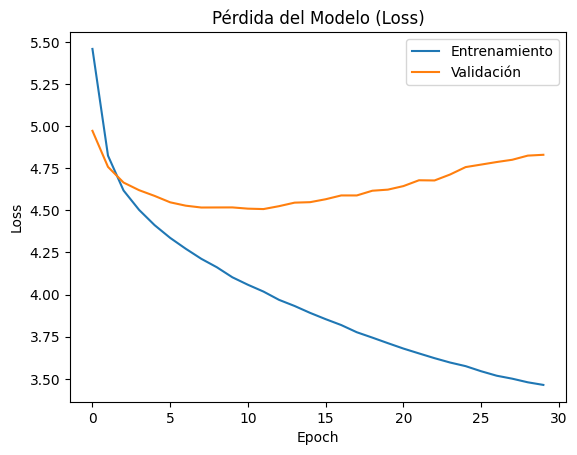

In [62]:
plt.plot(history.history['loss'], label='Entrenamiento')
plt.plot(history.history['val_loss'], label='Validación')
plt.title('Pérdida del Modelo (Loss)')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

El gráfico de pérdida demuestra signos de sobreajuste ya que la pérdida en entrenamiento baja considerablemente pero en validación se mantiene estable y más alto que en entrenamiento. Asimismo, el accuracy es bajo, posiblemente por dificultades con la distinción entre tantos géneros.

**Matriz de confusión**

In [ ]:
y_pred_probs = mod_clas.predict(X_test)
y_pred = np.argmax(y_pred_probs, axis=1)

#etiquetas unicas
index_presentes = np.unique(y_test)
nombres_presentes = [le.classes_[i] for i in index_presentes]

print(classification_report(y_test, y_pred, labels=index_presentes, target_names=nombres_presentes, zero_division=0))

390/390 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
                                                                                                        precision    recall  f1-score   support

                                               Arqueología - Ciencias naturales - Divulgación - Ensayo       0.00      0.00      0.00         1
                                                                      Arqueología - Crónica - Historia       0.00      0.00      0.00         1
                                                                             Arqueología - Divulgación       0.00      0.00      0.00         4
                                                         Arqueología - Divulgación - Ensayo - Historia       0.00      0.00      0.00         1
                                            Arqueología - Humor - Otros - Poesía - Referencia - Sátira       1.00      1.00      1.00         1
                                                     Arquitectura - Arte - Crónica - Ensayo - 

Se afirma que la baja precisión (accuracy) probablemente es por la gran variedad de clases en la variable 'Géneros'. Se usrá KMeans para ver en realidad cuántos clusters en realidad debería usarse.

In [70]:
from sklearn.cluster import KMeans

In [76]:
inertias = []
k_range = range(2, 15)
for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init=10).fit(X_train)
    inertias.append(km.inertia_)

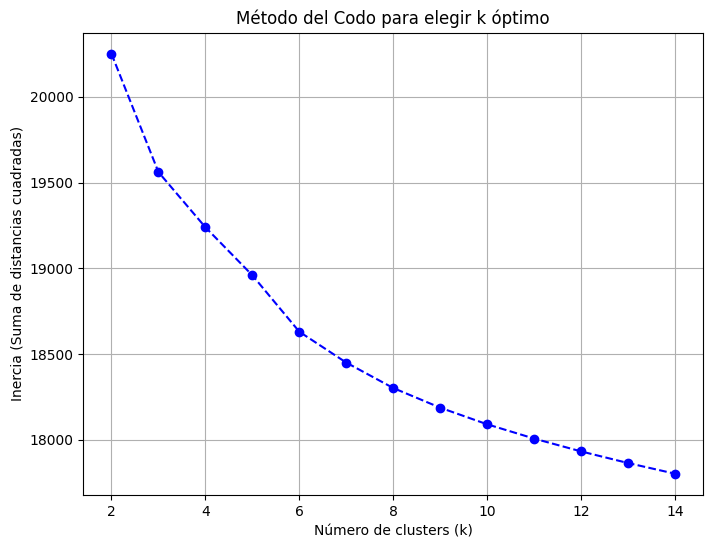

In [87]:
plt.figure(figsize=(8, 6))
plt.plot(k_range, inertias, marker='o', linestyle='--', color='b')
plt.xlabel('Número de clusters (k)')
plt.ylabel('Inercia (Suma de distancias cuadradas)')
plt.title('Método del Codo para elegir k óptimo')
plt.grid(True)
plt.show()

La curva obtenida es bastante suave. Lo que demuestra que los embeddings tienen o comparten un campo semántico bastante uniforme entre ellos. Se contínua con la graficación para verificar si k debería ser, por ej., ocho.

In [79]:
k_opt = 8
kmeans = KMeans(n_clusters=k_opt, n_init=10, random_state=42)
clusters = kmeans.fit_predict(sinopsis_vect)

selec_data_clusters = selec_data.copy()
selec_data_clusters['cluster_id'] = clusters

In [82]:
for i in range(8):
    print(f"____ Cluster {i}: ____")
    print(selec_data_clusters[selec_data_clusters['cluster_id'] == i]['generos'].value_counts().head(3))

____ Cluster 0: ____
generos
Intriga - Novela - Policíaco    88
Novela - Romántico              86
Novela - Policíaco              81
Name: count, dtype: int64
____ Cluster 1: ____
generos
Histórico - Novela        536
Ensayo - Historia         494
Divulgación - Historia    474
Name: count, dtype: int64
____ Cluster 2: ____
generos
Ciencia ficción - Novela    487
Novela - Policíaco          434
Histórico - Novela          432
Name: count, dtype: int64
____ Cluster 3: ____
generos
Novela - Romántico    1302
Intriga - Novela       693
Drama - Novela         463
Name: count, dtype: int64
____ Cluster 4: ____
generos
Ciencias sociales - Ensayo    424
Ciencia ficción - Novela      358
Ensayo - Filosofía            354
Name: count, dtype: int64
____ Cluster 5: ____
generos
Novela - Policíaco    805
Histórico - Novela    794
Intriga - Novela      663
Name: count, dtype: int64
____ Cluster 6: ____
generos
Novela - Policíaco              757
Intriga - Novela - Policíaco    577
Intriga - Novela 

Como hay clusters algo ambiguos, se chequea el valor k=8 con Silouette.

In [86]:
indices_muestra = np.random.choice(len(X), size=15000, replace=False)
X_muestra = X[indices_muestra]
labels_muestra = clusters[indices_muestra]

score = silhouette_score(X_muestra, labels_muestra)
print(f"Coeficiente de Silueta para k=8: {score:.4f}")

Coeficiente de Silueta para k=8: 0.2449


Dividir los embeddings en ocho clusters parece ser correcto. Los clusters parece que son algo parecidos pero pueden dividirse entre sí.